# 1. Introducción

---


El mejoramiento de imágenes en condiciones de baja iluminación (*Low-Light Image Enhancement*) busca recuperar detalles y mejorar la visibilidad de imágenes oscuras sin amplificar excesivamente el ruido. En este proyecto se trabajará con diferentes enfoques utilizando el dataset LOL (*Low-Light Dataset*), el cual contiene pares de imágenes en baja y buena iluminación.

En este notebook se implementará el método **Multi-Scale Retinex (MSR)**, basado en el paper *“Multi-Scale Retinex for Color Image Enhancement”*. Este método surge como una mejora de **Single Scale Retinex (SSR)**, el cual modela una imagen como:

$$
I(x,y)=L(x,y)\cdot R(x,y)
$$

donde:

- $I(x,y)$ representa la imagen observada,
- $L(x,y)$ la iluminación,
- $R(x,y)$ la reflectancia de los objetos.

La idea principal de Retinex es separar iluminación y reflectancia para mejorar la imagen de manera más natural, evitando únicamente aumentar el brillo global. SSR utiliza filtros gaussianos para estimar la iluminación de la escena, mientras que MSR combina múltiples escalas gaussianas para capturar tanto detalles locales como iluminación global, obteniendo resultados más balanceados.

Finalmente, los resultados serán evaluados mediante métricas como **PSNR** y **SSIM**.


---



# 2. Configuración del entorno

## Conexión al Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/8avo_Semestre/Proces_Imag/PROYECTO"

Mounted at /content/drive
/content/drive/MyDrive/8avo_Semestre/Proces_Imag/PROYECTO


## Librerías utilizadas

In [2]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 4.8 MB/s eta 0:00:00


In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchmetrics.image import PeakSignalNoiseRatio
from torchmetrics.image import StructuralSimilarityIndexMeasure

# 3. Carga del dataset

## Directorios de imágenes

In [4]:
low_path = "eval15/low"
high_path = "eval15/high"

## Verificación de archivos

In [5]:
low_images = sorted(os.listdir(low_path))
high_images = sorted(os.listdir(high_path))

print("Cantidad low:", len(low_images))
print("Cantidad high:", len(high_images))

print("\nPrimeras imágenes low:")
print(low_images[:5])

print("\nPrimeras imágenes high:")
print(high_images[:5])

Cantidad low: 15
Cantidad high: 15

Primeras imágenes low:
['1.png', '111.png', '146.png', '179.png', '22.png']

Primeras imágenes high:
['1.png', '111.png', '146.png', '179.png', '22.png']


## Visualización de ejemplo

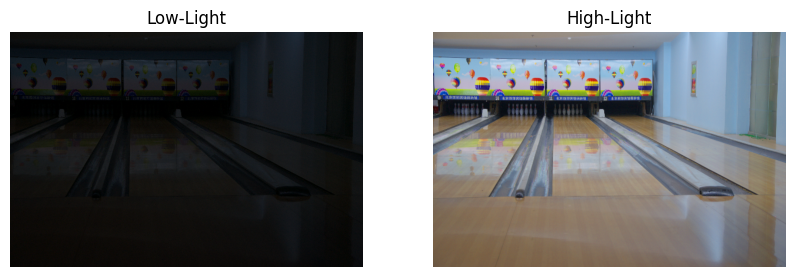

In [6]:
sample_name = low_images[10]

low_img = cv2.imread(os.path.join(low_path, sample_name))
high_img = cv2.imread(os.path.join(high_path, sample_name))

low_img = cv2.cvtColor(low_img, cv2.COLOR_BGR2RGB)
high_img = cv2.cvtColor(high_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(low_img)
plt.title("Low-Light")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(high_img)
plt.title("High-Light")
plt.axis("off")

plt.show()

# 4. Implementación de Single Scale Retinex (SSR)

SSR es la base del método MSR. La idea es comparar la imagen original con una versión suavizada mediante un filtro gaussiano. Esta imagen suavizada funciona como una aproximación de la iluminación.

$$
SSR(x,y)=\log(I(x,y))-\log(G_{\sigma}(x,y)*I(x,y))
$$

## Función para normalizar imágenes

In [7]:
def normalizar_imagen(img):
    img_min = np.min(img)
    img_max = np.max(img)

    img_norm = (img - img_min) / (img_max - img_min + 1e-8)
    img_norm = (img_norm * 255).astype(np.uint8)

    return img_norm

## Filtro gaussiano

In [8]:
def aplicar_gaussian_blur(img, sigma):
    img_float = img.astype(np.float32)

    img_blur = cv2.GaussianBlur(
        img_float,
        ksize=(0, 0),
        sigmaX=sigma,
        sigmaY=sigma
    )

    return img_blur

## Función SSR

In [9]:
def single_scale_retinex(img, sigma):
    img_float = img.astype(np.float32) + 1 #para evitar log(0)

    img_blur = aplicar_gaussian_blur(img_float, sigma)

    log_original = np.log(img_float)
    log_blur = np.log(img_blur)

    ssr = log_original - log_blur

    return ssr, img_blur, log_original, log_blur

## Probando SSR con una imagen

In [10]:
sigma = 80

ssr_result, img_blur, log_original, log_blur = single_scale_retinex(low_img, sigma)

ssr_visual = normalizar_imagen(ssr_result)
blur_visual = normalizar_imagen(img_blur)
log_original_visual = normalizar_imagen(log_original)
log_blur_visual = normalizar_imagen(log_blur)

## Visualización

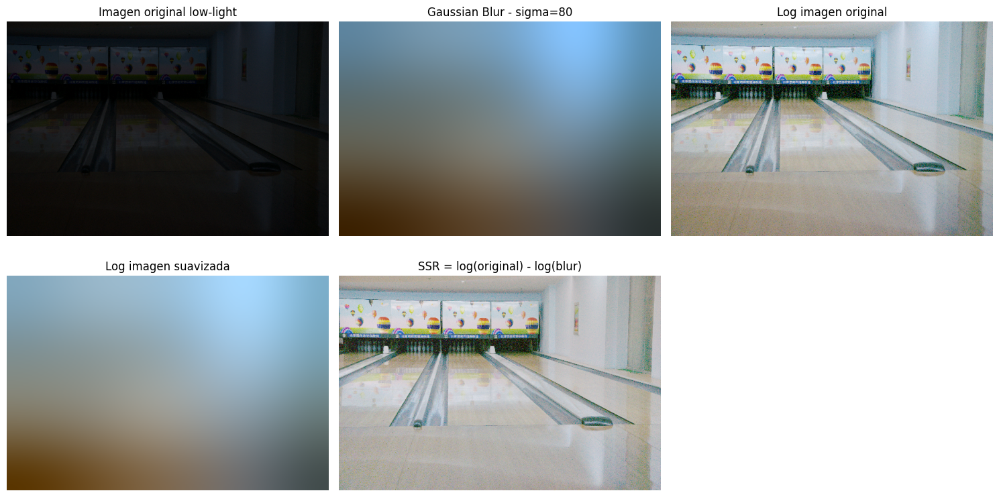

In [11]:
plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.imshow(low_img)
plt.title("Imagen original low-light")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(blur_visual)
plt.title(f"Gaussian Blur - sigma={sigma}")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(log_original_visual)
plt.title("Log imagen original")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(log_blur_visual)
plt.title("Log imagen suavizada")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(ssr_visual)
plt.title("SSR = log(original) - log(blur)")
plt.axis("off")

plt.tight_layout()
plt.show()

## Efecto de diferentes escalas gaussianas

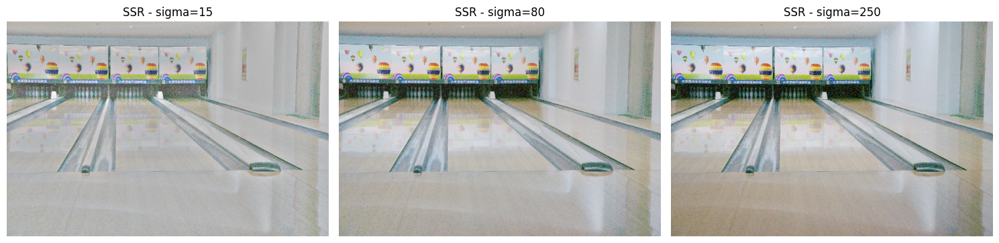

In [12]:
sigmas = [15, 80, 250]

plt.figure(figsize=(15,5))

for i, sigma in enumerate(sigmas):

    ssr_result, _, _, _ = single_scale_retinex(low_img, sigma)

    ssr_visual = normalizar_imagen(ssr_result)

    plt.subplot(1, 3, i+1)
    plt.imshow(ssr_visual)
    plt.title(f"SSR - sigma={sigma}")
    plt.axis("off")

plt.tight_layout()
plt.show()

# 5. Implementación de Multi-Scale Retinex (MSR)



MSR surge como una mejora de SSR al utilizar múltiples escalas gaussianas en lugar de una sola. La idea es combinar información local y global de iluminación para obtener resultados más naturales.

$$
MSR(x,y)=\sum_{n=1}^{N} w_nSSR_n(x,y)
$$

## Función MSR

In [13]:
def multi_scale_retinex(img, sigmas, weights):

    msr = np.zeros_like(img.astype(np.float32))

    for sigma, weight in zip(sigmas, weights):

        ssr_result, _, _, _ = single_scale_retinex(img, sigma)
        msr += weight * ssr_result

    return msr

## Probando MSR

In [14]:
sigmas = [15, 80, 250]
weights = [0.2, 0.3, 0.5]

msr_result = multi_scale_retinex(low_img, sigmas, weights)

msr_visual = normalizar_imagen(msr_result)

## Visulaización

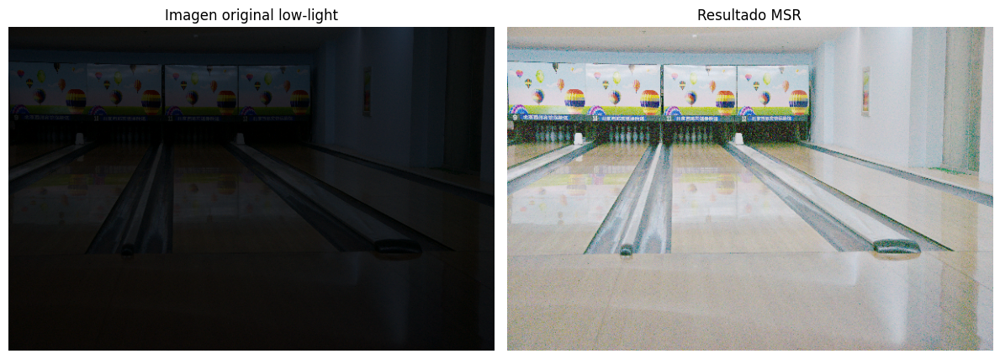

In [15]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(low_img)
plt.title("Imagen original low-light")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(msr_visual)
plt.title("Resultado MSR")
plt.axis("off")

plt.tight_layout()
plt.show()

# 6. Evaluación del método

## Función para convertir imagen a tensor

In [16]:
def imagen_a_tensor(img):
    img = img.astype(np.float32) / 255.0
    img = np.transpose(img, (2, 0, 1))
    img = torch.from_numpy(img).unsqueeze(0)
    return img

## Función para evaluar metodos en las 15 imágenes

In [17]:
def evaluar_metodo(low_path, high_path, metodo, nombre_metodo="Metodo"):
    psnr_metric = PeakSignalNoiseRatio(data_range=1.0)
    ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0)

    resultados = []
    nombres = sorted([n for n in os.listdir(low_path) if n != ".DS_Store"])

    for nombre in nombres:
        low_img = cv2.imread(os.path.join(low_path, nombre))
        high_img = cv2.imread(os.path.join(high_path, nombre))

        if low_img is None or high_img is None:
            print(f"No se pudo leer: {nombre}")
            continue

        low_img = cv2.cvtColor(low_img, cv2.COLOR_BGR2RGB)
        high_img = cv2.cvtColor(high_img, cv2.COLOR_BGR2RGB)

        resultado = metodo(low_img)
        resultado_visual = normalizar_imagen(resultado)

        pred_tensor = imagen_a_tensor(resultado_visual)
        target_tensor = imagen_a_tensor(high_img)

        psnr = psnr_metric(pred_tensor, target_tensor).item()
        ssim = ssim_metric(pred_tensor, target_tensor).item()

        resultados.append({
            "metodo": nombre_metodo,
            "imagen": nombre,
            "PSNR": psnr,
            "SSIM": ssim
        })

    return pd.DataFrame(resultados)

In [18]:
def metodo_ssr(img):
    ssr_result, _, _, _ = single_scale_retinex(img, sigma=80)
    return ssr_result

def metodo_msr(img):
    sigmas = [15, 80, 250]
    weights = [0.2, 0.3, 0.5]
    return multi_scale_retinex(img, sigmas, weights)

## Ejecutar evaluación

In [19]:
import pandas as pd

df_ssr = evaluar_metodo(low_path, high_path, metodo_ssr, "SSR")
df_msr = evaluar_metodo(low_path, high_path, metodo_msr, "MSR")

df_resultados = pd.concat([df_ssr, df_msr], ignore_index=True)

df_tabla = df_resultados.pivot(
    index="imagen",
    columns="metodo",
    values=["PSNR", "SSIM"]
)

df_tabla.columns = [f"{metrica}_{metodo}" for metrica, metodo in df_tabla.columns]
df_tabla = df_tabla.reset_index()

df_tabla

,imagen,PSNR_MSR,PSNR_SSR,SSIM_MSR,SSIM_SSR
0,1.png,12.102580,11.714957,0.643543,0.647606
1,111.png,21.538351,20.502653,0.735688,0.737139
2,146.png,17.641319,16.560125,0.763850,0.761375
3,179.png,9.566467,9.366639,0.551029,0.548418
4,22.png,15.079521,13.767950,0.651689,0.651247
5,23.png,16.077246,14.145803,0.512032,0.526984
6,493.png,11.303271,11.000010,0.377367,0.388534
7,547.png,11.216870,11.200727,0.522410,0.531439
8,55.png,17.379774,18.690830,0.525056,0.530350
9,665.png,18.470041,18.541861,0.507468,0.513601


## Media y desviación estándar

In [20]:
df_resumen = df_resultados.groupby("metodo")[["PSNR", "SSIM"]].agg(["mean", "std"])
df_resumen.round(4)

PSNR            SSIM        
           mean     std    mean     std
metodo                                 
MSR     15.5597  3.4709  0.5895  0.1103
SSR     15.0859  3.4552  0.5939  0.1076

In [21]:
mejor_msr = df_tabla.loc[df_tabla["PSNR_MSR"].idxmax()]
peor_msr = df_tabla.loc[df_tabla["PSNR_MSR"].idxmin()]

print("===== MEJOR CASO MSR =====")
print(mejor_msr)

print("\n===== PEOR CASO MSR =====")
print(peor_msr)

===== MEJOR CASO MSR =====
imagen        111.png
PSNR_MSR    21.538351
PSNR_SSR    20.502653
SSIM_MSR     0.735688
SSIM_SSR     0.737139
Name: 1, dtype: object

===== PEOR CASO MSR =====
imagen       179.png
PSNR_MSR    9.566467
PSNR_SSR    9.366639
SSIM_MSR    0.551029
SSIM_SSR    0.548418
Name: 3, dtype: object


# 7. Comparación entre SSR y MSR

In [22]:
def mostrar_comparacion(nombre_imagen):

    low_img = cv2.imread(os.path.join(low_path, nombre_imagen))
    high_img = cv2.imread(os.path.join(high_path, nombre_imagen))

    low_img = cv2.cvtColor(low_img, cv2.COLOR_BGR2RGB)
    high_img = cv2.cvtColor(high_img, cv2.COLOR_BGR2RGB)

    # SSR
    ssr_result, _, _, _ = single_scale_retinex(low_img, sigma=80)
    ssr_visual = normalizar_imagen(ssr_result)

    # MSR
    sigmas = [15, 80, 250]
    weights = [0.3, 0.4, 0.3]

    msr_result = multi_scale_retinex(low_img, sigmas, weights)
    msr_visual = normalizar_imagen(msr_result)

    #metricas
    fila = df_tabla[df_tabla["imagen"] == nombre_imagen].iloc[0]

    plt.figure(figsize=(16,5))

    plt.subplot(1,4,1)
    plt.imshow(low_img)
    plt.title("Low-Light")
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.imshow(ssr_visual)
    plt.title(
        f"SSR\nPSNR: {fila['PSNR_SSR']:.2f}\nSSIM: {fila['SSIM_SSR']:.3f}"
    )
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.imshow(msr_visual)
    plt.title(
        f"MSR\nPSNR: {fila['PSNR_MSR']:.2f}\nSSIM: {fila['SSIM_MSR']:.3f}"
    )
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.imshow(high_img)
    plt.title("High-Light")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

## Mostrar mejor caso

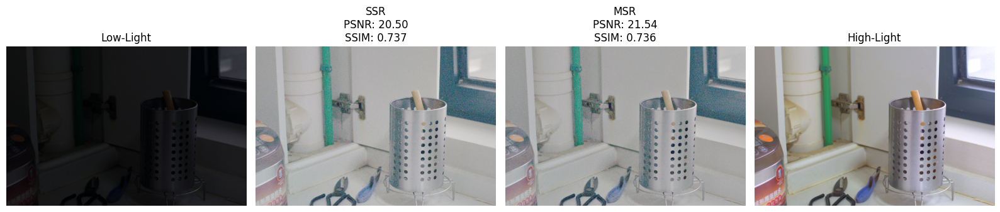

In [23]:
mostrar_comparacion(mejor_msr["imagen"])

## Mostrar peor caso

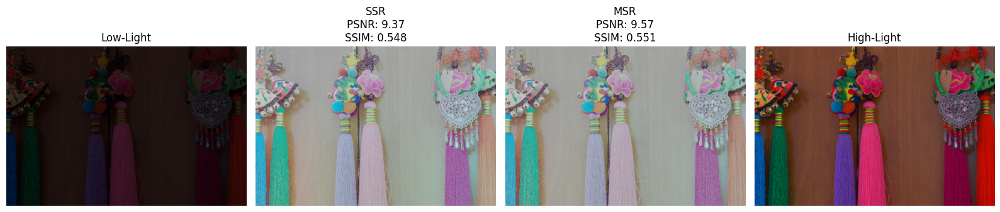

In [24]:
mostrar_comparacion(peor_msr["imagen"])

## Mostrando todas las comparaciones

In [25]:
def mostrar_todas_las_comparaciones():

    nombres = df_tabla["imagen"].tolist()

    for nombre in nombres:

        mostrar_comparacion(nombre)

In [26]:
mostrar_todas_las_comparaciones()

Output hidden; open in https://colab.research.google.com to view.

# 8. Agregando correccion gamma para mejora

## Función gamma

In [27]:
def correccion_gamma(img, gamma=1.0):
    img_norm = img.astype(np.float32) / 255.0
    img_gamma = np.power(img_norm, gamma)
    img_gamma = np.clip(img_gamma * 255, 0, 255).astype(np.uint8)
    return img_gamma

In [28]:
gammas = [0.8, 1.0, 1.2, 1.4]

## Probar con la peor imagen MSR

In [29]:
peor_msr = df_tabla.loc[df_tabla["PSNR_MSR"].idxmin()]
nombre_peor = peor_msr["imagen"]

print(nombre_peor)
print(peor_msr)

179.png
imagen       179.png
PSNR_MSR    9.566467
PSNR_SSR    9.366639
SSIM_MSR    0.551029
SSIM_SSR    0.548418
Name: 3, dtype: object


In [30]:
def probar_gamma_en_imagen(nombre_imagen, gammas):
    psnr_metric = PeakSignalNoiseRatio(data_range=1.0)
    ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0)

    low_img = cv2.imread(os.path.join(low_path, nombre_imagen))
    high_img = cv2.imread(os.path.join(high_path, nombre_imagen))

    low_img = cv2.cvtColor(low_img, cv2.COLOR_BGR2RGB)
    high_img = cv2.cvtColor(high_img, cv2.COLOR_BGR2RGB)

    sigmas = [15, 80, 250]
    weights = [0.2,0.3,0.5]

    msr_result = multi_scale_retinex(low_img, sigmas, weights)
    msr_visual = normalizar_imagen(msr_result)

    resultados_gamma = []

    plt.figure(figsize=(4 * (len(gammas) + 2), 5))

    plt.subplot(1, len(gammas) + 2, 1)
    plt.imshow(low_img)
    plt.title("Low")
    plt.axis("off")

    plt.subplot(1, len(gammas) + 2, 2)
    plt.imshow(msr_visual)
    plt.title("MSR base")
    plt.axis("off")

    for i, gamma in enumerate(gammas):
        img_gamma = correccion_gamma(msr_visual, gamma)

        pred_tensor = imagen_a_tensor(img_gamma)
        target_tensor = imagen_a_tensor(high_img)

        psnr = psnr_metric(pred_tensor, target_tensor).item()
        ssim = ssim_metric(pred_tensor, target_tensor).item()

        resultados_gamma.append({
            "imagen": nombre_imagen,
            "gamma": gamma,
            "PSNR": psnr,
            "SSIM": ssim
        })

        plt.subplot(1, len(gammas) + 2, i + 3)
        plt.imshow(img_gamma)
        plt.title(f"Gamma={gamma}\nPSNR:{psnr:.2f}\nSSIM:{ssim:.3f}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

    return pd.DataFrame(resultados_gamma)

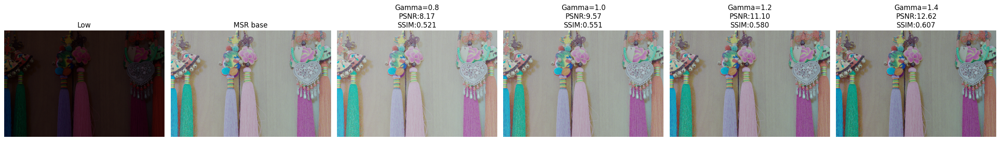

,imagen,gamma,PSNR,SSIM
0,179.png,0.8,8.174765,0.521460
1,179.png,1.0,9.566467,0.551029
2,179.png,1.2,11.097245,0.579602
3,179.png,1.4,12.616352,0.607130


In [31]:
df_gamma_peor = probar_gamma_en_imagen(nombre_peor, gammas)
df_gamma_peor

In [32]:
gamma_final = 1.4

def metodo_ssr_gamma(img):
    ssr_result, _, _, _ = single_scale_retinex(img, sigma=80)
    ssr_img = normalizar_imagen(ssr_result)
    ssr_gamma = correccion_gamma(ssr_img, gamma=gamma_final)
    return ssr_gamma

def metodo_msr_gamma(img):
    sigmas = [15, 80, 250]
    weights = [0.2, 0.3, 0.5]

    msr_result = multi_scale_retinex(img, sigmas, weights)
    msr_img = normalizar_imagen(msr_result)
    msr_gamma = correccion_gamma(msr_img, gamma=gamma_final)
    return msr_gamma

In [33]:
df_ssr_gamma = evaluar_metodo(low_path, high_path, metodo_ssr_gamma, "SSR + Gamma")
df_msr_gamma = evaluar_metodo(low_path, high_path, metodo_msr_gamma, "MSR + Gamma")

df_gamma = pd.concat([df_ssr_gamma, df_msr_gamma], ignore_index=True)

No se pudo leer: mia_low.HEIC
No se pudo leer: tony_low.HEIC
No se pudo leer: mia_low.HEIC
No se pudo leer: tony_low.HEIC


In [34]:
df_gamma.groupby("metodo")[["PSNR", "SSIM"]].agg(["mean", "std"]).round(4)

PSNR            SSIM        
                mean     std    mean     std
metodo                                      
MSR + Gamma  16.4301  3.1426  0.5928  0.1072
SSR + Gamma  16.0643  3.2053  0.5976  0.1036

* La corrección gamma se agregó como postprocesamiento para compensar la apariencia pálida generada por MSR. Experimentalmente, con gamma = 1.4 se obtuvo una mejora en PSNR y una ligera mejora en SSIM, por lo que se seleccionó esta configuración para los resultados finales.

# 9. Resultados finales

## Resumen de métricas

In [35]:
df_ssr_gamma = evaluar_metodo(
    low_path,
    high_path,
    metodo_ssr_gamma,
    "SSR + Gamma"
)

df_msr_gamma = evaluar_metodo(
    low_path,
    high_path,
    metodo_msr_gamma,
    "MSR + Gamma"
)

df_resultados_gamma = pd.concat(
    [df_ssr_gamma, df_msr_gamma],
    ignore_index=True
)

df_tabla_gamma = df_resultados_gamma.pivot(
    index="imagen",
    columns="metodo",
    values=["PSNR", "SSIM"]
)

df_tabla_gamma.columns = [
    f"{metrica}_{metodo}"
    for metrica, metodo in df_tabla_gamma.columns
]

df_tabla_gamma = df_tabla_gamma.reset_index()

df_tabla_gamma

No se pudo leer: mia_low.HEIC
No se pudo leer: tony_low.HEIC
No se pudo leer: mia_low.HEIC
No se pudo leer: tony_low.HEIC


,imagen,PSNR_MSR + Gamma,PSNR_SSR + Gamma,SSIM_MSR + Gamma,SSIM_SSR + Gamma
0,1.png,14.607237,13.262714,0.671116,0.673351
1,111.png,18.145954,20.201801,0.714430,0.722111
2,146.png,20.803755,19.496473,0.769090,0.765794
3,179.png,12.740118,12.424593,0.609350,0.605861
4,22.png,17.741117,15.766060,0.656679,0.652951
5,23.png,13.926200,12.043083,0.476694,0.485694
6,493.png,15.058315,14.640579,0.418073,0.431726
7,547.png,14.840070,14.688021,0.529167,0.539473
8,55.png,13.223462,14.633178,0.477877,0.486976
9,665.png,13.381291,13.760320,0.466303,0.476530


In [36]:
df_resultados_gamma.groupby("metodo")[["PSNR", "SSIM"]].agg(["mean", "std"]).round(4)

PSNR            SSIM        
                mean     std    mean     std
metodo                                      
MSR + Gamma  16.4301  3.1426  0.5928  0.1072
SSR + Gamma  16.0643  3.2053  0.5976  0.1036

## Mejor y peor caso de MSR + Gamma

In [37]:
mejor_msr_gamma = df_tabla_gamma.loc[
    df_tabla_gamma["PSNR_MSR + Gamma"].idxmax()
]

peor_msr_gamma = df_tabla_gamma.loc[
    df_tabla_gamma["PSNR_MSR + Gamma"].idxmin()
]

print("===== MEJOR CASO MSR =====")
print(mejor_msr_gamma)

print("\n===== PEOR CASO MSR =====")
print(peor_msr_gamma)

===== MEJOR CASO MSR =====
imagen                748.png
PSNR_MSR + Gamma    22.963234
PSNR_SSR + Gamma    22.734283
SSIM_MSR + Gamma     0.689112
SSIM_SSR + Gamma     0.693515
Name: 11, dtype: object

===== PEOR CASO MSR =====
imagen                179.png
PSNR_MSR + Gamma    12.740118
PSNR_SSR + Gamma    12.424593
SSIM_MSR + Gamma      0.60935
SSIM_SSR + Gamma     0.605861
Name: 3, dtype: object


## Comparación: Low, MSR, MSR + Gamma, High

In [38]:
def mostrar_msr_vs_gamma(nombre_imagen, gamma=1.4):
    low_img = cv2.imread(os.path.join(low_path, nombre_imagen))
    high_img = cv2.imread(os.path.join(high_path, nombre_imagen))

    low_img = cv2.cvtColor(low_img, cv2.COLOR_BGR2RGB)
    high_img = cv2.cvtColor(high_img, cv2.COLOR_BGR2RGB)

    sigmas = [15, 80, 250]
    weights = [0.2, 0.3, 0.5]

    msr_result = multi_scale_retinex(low_img, sigmas, weights)
    msr_img = normalizar_imagen(msr_result)

    msr_gamma = correccion_gamma(msr_img, gamma=gamma)

    plt.figure(figsize=(16, 5))

    imagenes = [low_img, msr_img, msr_gamma, high_img]
    titulos = ["Low-Light", "MSR", f"MSR + Gamma {gamma}", "High-Light"]

    for i in range(4):
        plt.subplot(1, 4, i + 1)
        plt.imshow(imagenes[i])
        plt.title(titulos[i])
        plt.axis("off")

    plt.tight_layout()
    plt.show()

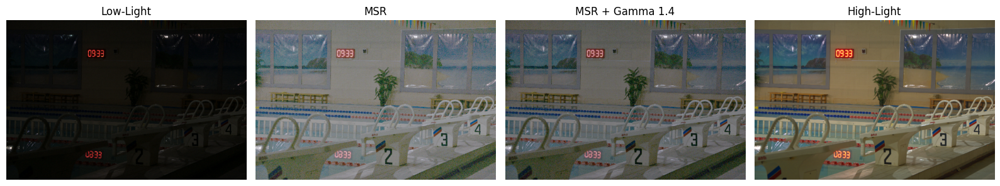

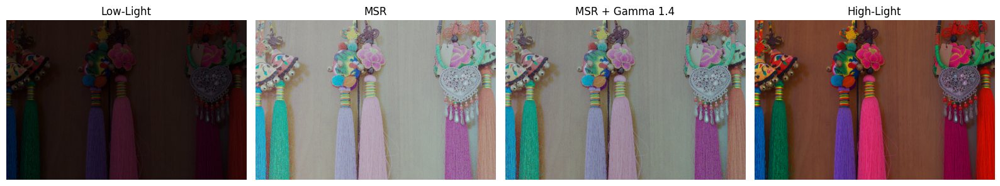

In [39]:
mostrar_msr_vs_gamma(mejor_msr_gamma["imagen"], gamma=1.4)
mostrar_msr_vs_gamma(peor_msr_gamma["imagen"], gamma=1.4)

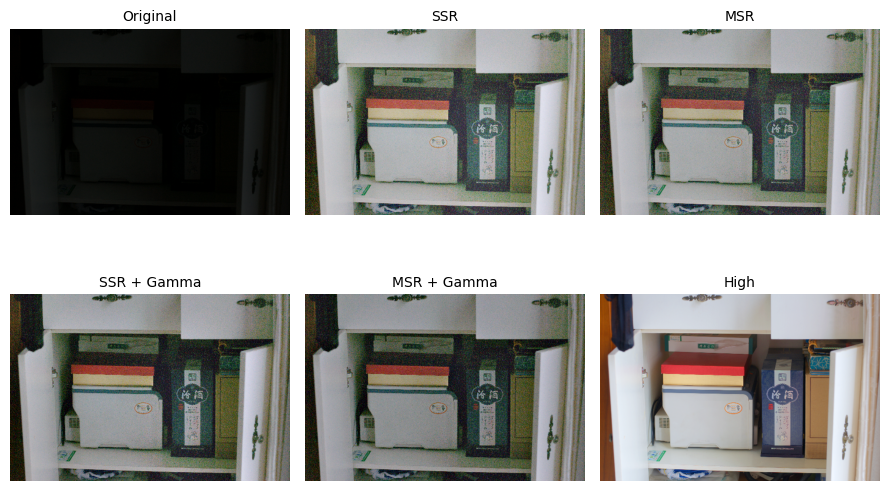

In [40]:
def guardar_comparacion_final(nombre_imagen="55.png", gamma=1.4, output_path="comparacion_final_55.png"):
    low_img = cv2.imread(os.path.join(low_path, nombre_imagen))
    high_img = cv2.imread(os.path.join(high_path, nombre_imagen))

    low_img = cv2.cvtColor(low_img, cv2.COLOR_BGR2RGB)
    high_img = cv2.cvtColor(high_img, cv2.COLOR_BGR2RGB)

    # SSR
    ssr_result, _, _, _ = single_scale_retinex(low_img, sigma=80)
    ssr_img = normalizar_imagen(ssr_result)
    ssr_gamma = correccion_gamma(ssr_img, gamma=gamma)

    # MSR
    sigmas = [15, 80, 250]
    weights = [0.2, 0.3, 0.5]

    msr_result = multi_scale_retinex(low_img, sigmas, weights)
    msr_img = normalizar_imagen(msr_result)
    msr_gamma = correccion_gamma(msr_img, gamma=gamma)

    imagenes = [
        (low_img, "Original"),
        (ssr_img, "SSR"),
        (msr_img, "MSR"),
        (ssr_gamma, f"SSR + Gamma"),
        (msr_gamma, f"MSR + Gamma"),
        (high_img, "High")
    ]

    plt.figure(figsize=(9, 6))

    for i, (img, titulo) in enumerate(imagenes):
        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.title(titulo, fontsize=10)
        plt.axis("off")

    plt.tight_layout()
    plt.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.show()

guardar_comparacion_final("55.png", gamma=1.4, output_path="comparacion_final_55.png")

In [46]:
!pip install pillow-heif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 16.1 MB/s eta 0:00:00


In [47]:
from pillow_heif import register_heif_opener
from PIL import Image

register_heif_opener()

In [48]:
def leer_heic(path):
    img = Image.open(path)
    img = np.array(img)
    return img

In [51]:
def comparar_perro(nombre_imagen, gamma=1.4):

    ruta = os.path.join("/content/drive/MyDrive/8avo_Semestre/Proces_Imag/PROYECTO", nombre_imagen)

    low_img = leer_heic(ruta)

    ssr_result, _, _, _ = single_scale_retinex(low_img, sigma=80)
    ssr_img = normalizar_imagen(ssr_result)

    sigmas = [15, 80, 250]
    weights = [0.2, 0.3, 0.5]

    msr_result = multi_scale_retinex(low_img, sigmas, weights)
    msr_img = normalizar_imagen(msr_result)

    msr_gamma = correccion_gamma(msr_img, gamma=gamma)

    imagenes = [
        (low_img, "Original"),
        (ssr_img, "SSR"),
        (msr_img, "MSR"),
        (msr_gamma, "MSR + Gamma")
    ]

    plt.figure(figsize=(16,5))

    for i, (img, titulo) in enumerate(imagenes):

        plt.subplot(1,4,i+1)
        plt.imshow(img)
        plt.title(titulo)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

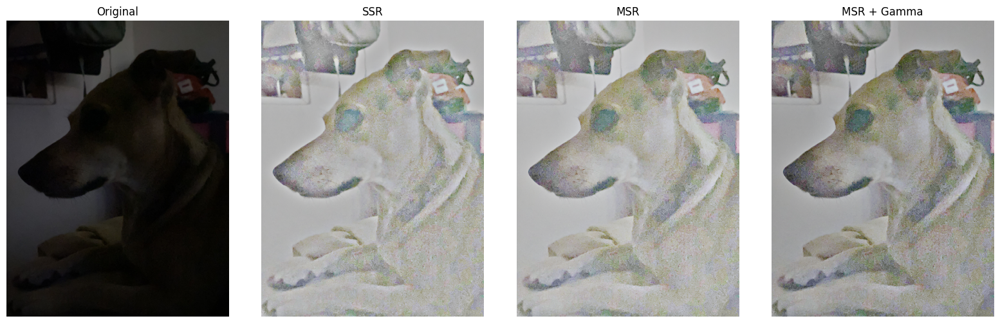

In [52]:
comparar_perro("mia_low.HEIC")

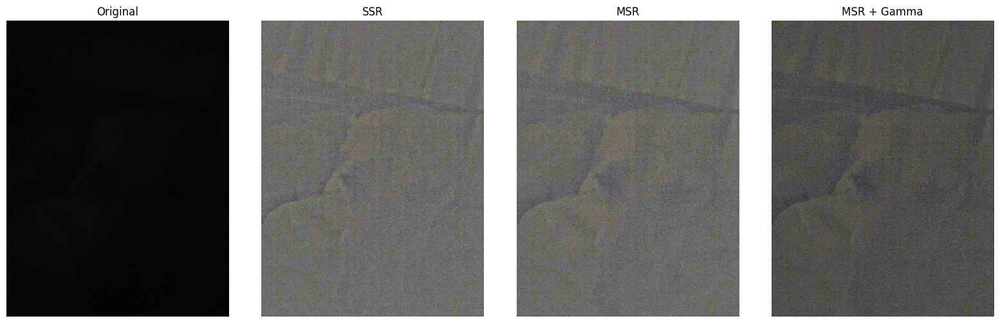

In [54]:
comparar_perro("mia2.HEIC")

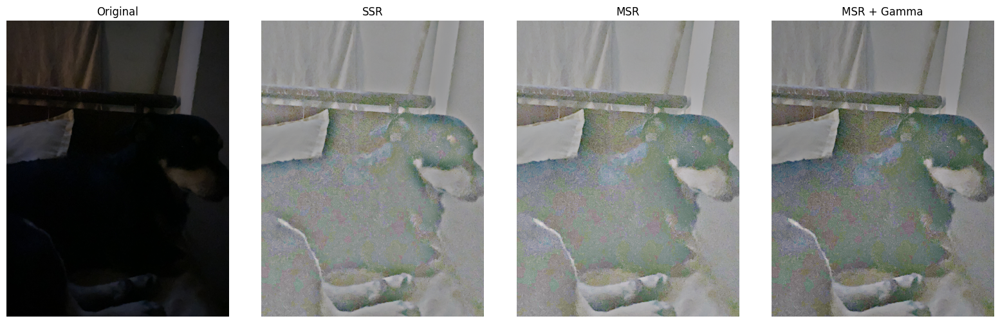

In [53]:
comparar_perro("tony_low.HEIC")